### Perceptron trick

* applied in a linearly sepreable data (which can be seprated by drawing a line between them)
* the equation of line in this is not y=mx+b but its -> Ax + By + C = 0

* objective is to find the vlaue of A,B,C and start with a random value 

* keep adding a variable for higher dimension like for 3d the  eq of line will be Ax1 + Bx2 + Cx3 + D = 0...

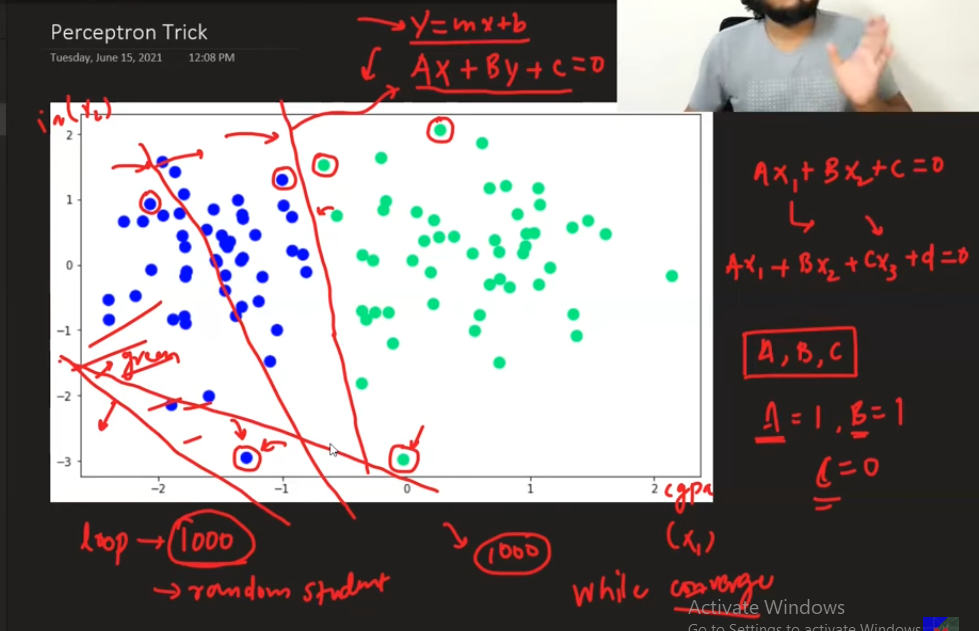

### Transformation

* if C value is changed you can move parallely 
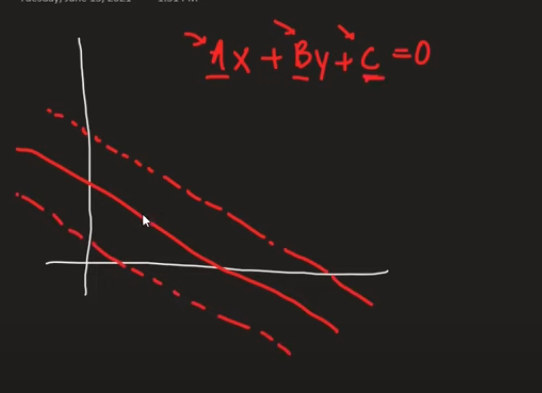

* if A value is changed then the line rotate around the y-axis 
* if B value is changed then the line rotate around the x-axis
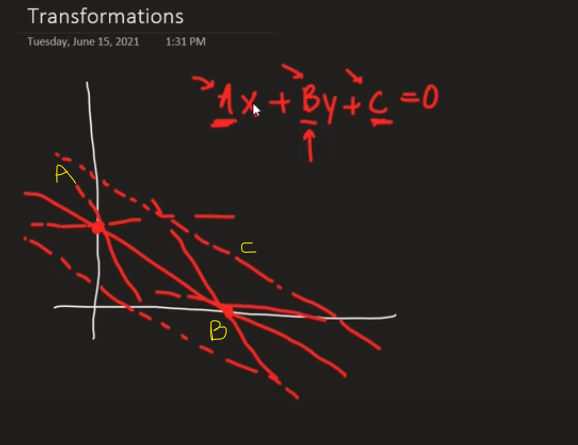

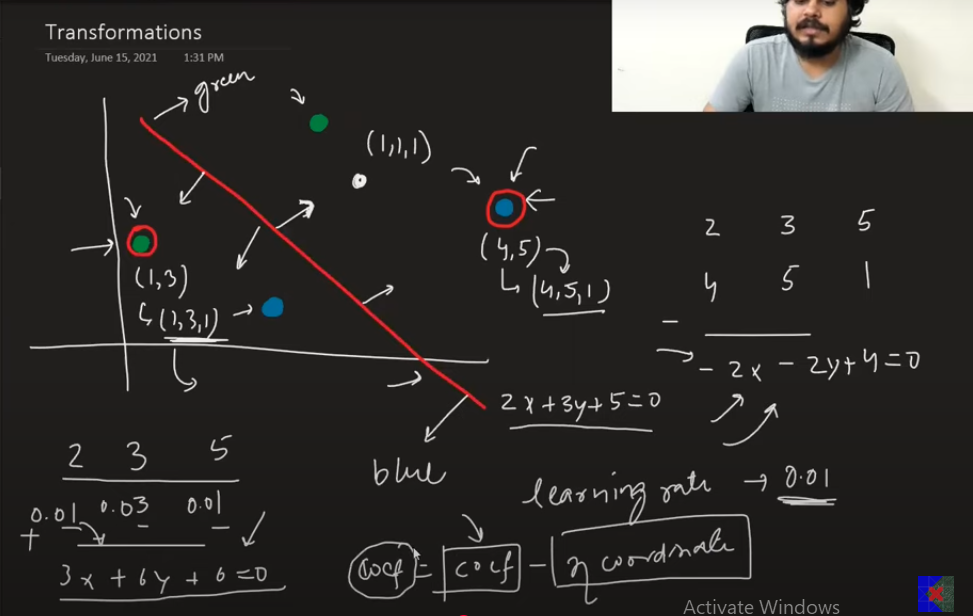
* put a one in the cordinates and 
* if a negative point is in positive region then we put a one in the last and subtract it with the eq of line
* if a possitive point is in the negative region then we put a one in it and add it with the eq of line 

* also applie learning rate 

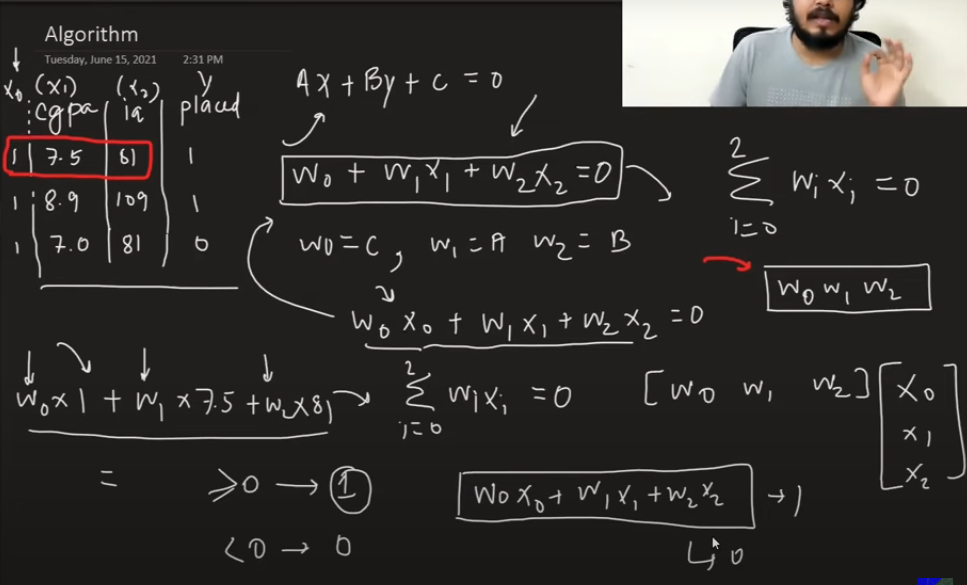

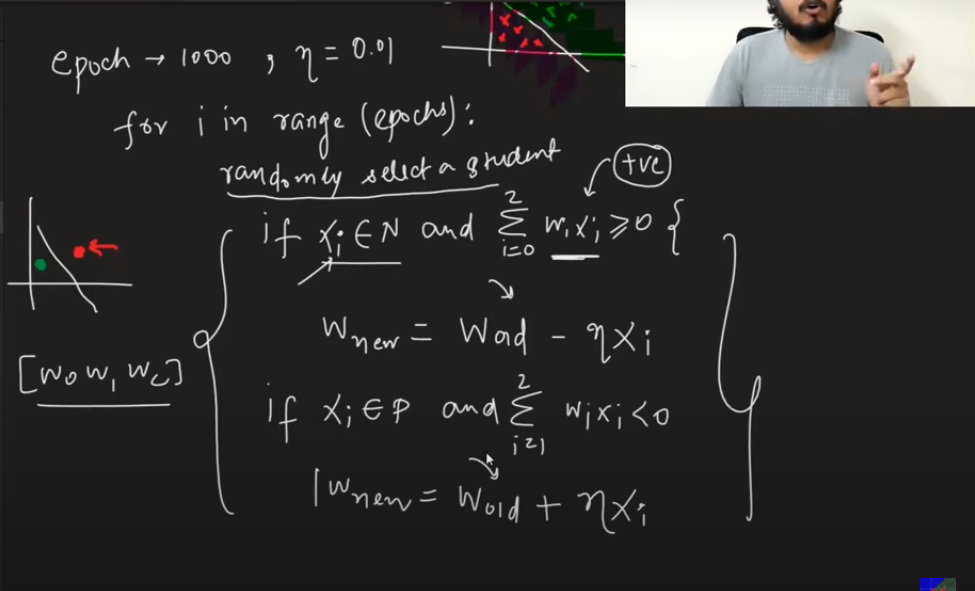
* if xi belongs to negative but the our model says its positive then the wnew = wold - (learning rate * xi)

* if xi belongs to positive but the model says its negative then the wnew = wold - (leanrningrate * xi)



# simplified
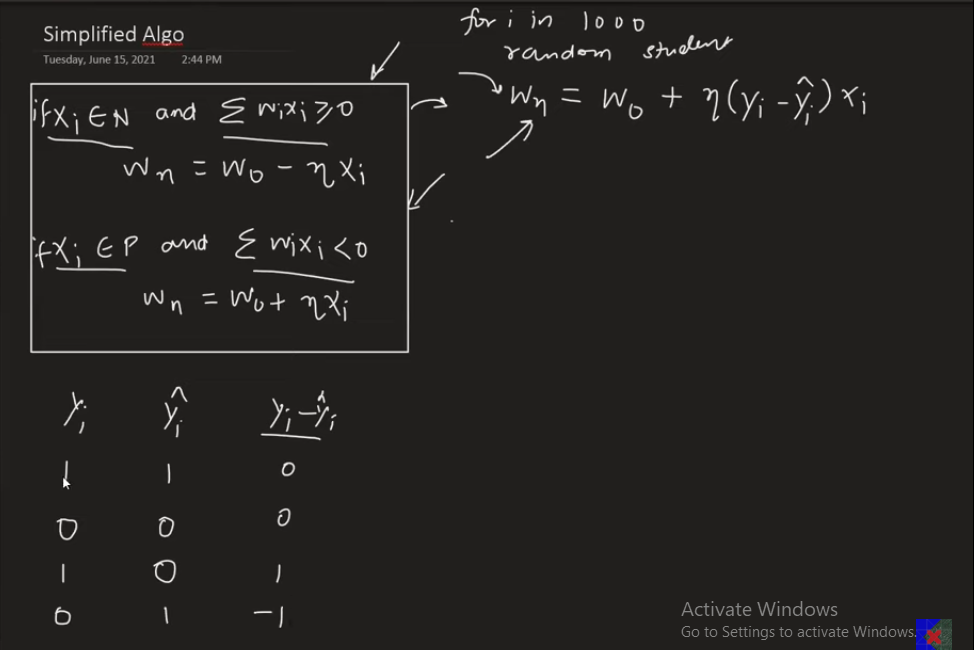

# Coding perceptron trick and finding its problem

In [1]:
from sklearn.datasets import make_classification
import numpy as np

In [2]:
X, y = make_classification(n_samples=100, n_features=2, n_informative=1, n_redundant=0, n_classes=2, n_clusters_per_class=1, random_state=41, hypercube=False, class_sep=10)

In [3]:
import matplotlib.pyplot as plt

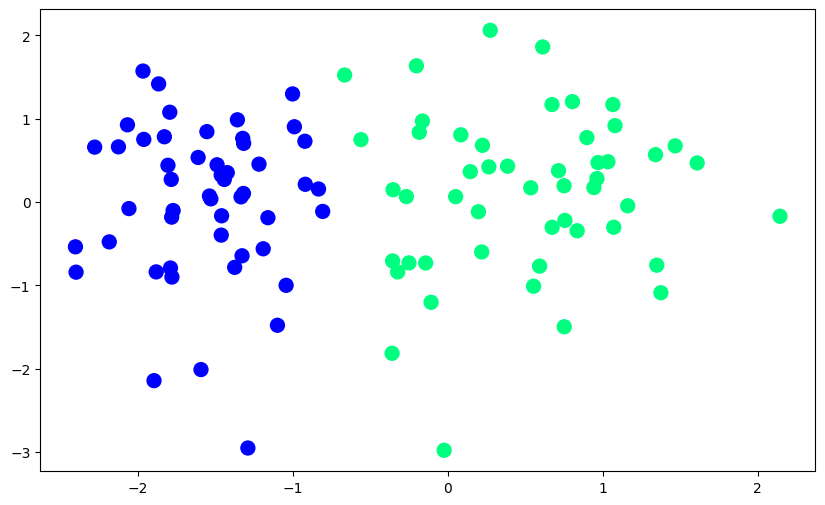

In [4]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0], X[:, 1], c=y, cmap='winter', s=100)

In [7]:
X

array([[ 0.19924745, -0.11697552],
       [-0.24882029, -0.73115232],
       [-0.3544904 , -0.7081059 ],
       [-1.59086506, -2.01199214],
       [-0.20083951,  1.63493163],
       [-0.83241122,  0.15599044],
       [-1.79207014,  1.07782053],
       [ 0.0856607 ,  0.80626713],
       [-0.55865299,  0.74859527],
       [-1.95974262,  0.75152794],
       [-1.77828947, -0.90114581],
       [-1.77985853, -0.1815243 ],
       [-0.02194151, -2.98092432],
       [ 0.80563431,  1.20500136],
       [-1.82701214,  0.78302407],
       [ 0.38730728,  0.42968688],
       [-0.14108668, -0.73229726],
       [-1.87955941, -0.83930476],
       [-0.18232911,  0.83727062],
       [-1.77059533, -0.10255323],
       [-2.27658028,  0.65867001],
       [-2.06519502,  0.92649819],
       [-1.31690551,  0.10216193],
       [ 1.61043259,  0.46886454],
       [-1.21650394,  0.45432938],
       [ 0.6139723 ,  1.8613386 ],
       [-1.78760957, -0.79255991],
       [-1.04149161, -1.0004391 ],
       [-2.40067584,

In [8]:
np.insert(X,0,1,axis=1)

array([[ 1.        ,  0.19924745, -0.11697552],
       [ 1.        , -0.24882029, -0.73115232],
       [ 1.        , -0.3544904 , -0.7081059 ],
       [ 1.        , -1.59086506, -2.01199214],
       [ 1.        , -0.20083951,  1.63493163],
       [ 1.        , -0.83241122,  0.15599044],
       [ 1.        , -1.79207014,  1.07782053],
       [ 1.        ,  0.0856607 ,  0.80626713],
       [ 1.        , -0.55865299,  0.74859527],
       [ 1.        , -1.95974262,  0.75152794],
       [ 1.        , -1.77828947, -0.90114581],
       [ 1.        , -1.77985853, -0.1815243 ],
       [ 1.        , -0.02194151, -2.98092432],
       [ 1.        ,  0.80563431,  1.20500136],
       [ 1.        , -1.82701214,  0.78302407],
       [ 1.        ,  0.38730728,  0.42968688],
       [ 1.        , -0.14108668, -0.73229726],
       [ 1.        , -1.87955941, -0.83930476],
       [ 1.        , -0.18232911,  0.83727062],
       [ 1.        , -1.77059533, -0.10255323],
       [ 1.        , -2.27658028,  0.658

In [9]:
def step(z):
    return 1 if z>0 else 0

In [19]:
def perceptron(X,y):

    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.01

    for i in range(1000):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j], weights))
        weights = weights + lr*(y[j] - y_hat)*X[j]

    return weights[0], weights[1:]

In [13]:
np.dot(X[41],[1,1,1]) #weights = [1,1,1]

ValueError: shapes (2,) and (3,) not aligned: 2 (dim 0) != 3 (dim 0)

In [15]:
np.insert(X[41], 0, 1)

array([ 1.        , -0.91783293,  0.21243302])

In [14]:
np.dot(np.insert(X[41], 0, 1),[1,1,1]) #weights = [1,1,1]

0.2946000908036749

In [20]:
intercept_, coef_ = perceptron(X,y)

In [ ]:
print(intercept_) #W0
print(coef_) # W1 , W2

0.9099999999999999
[1.32103643 0.25172907]


### calculating m and b to plot the line 
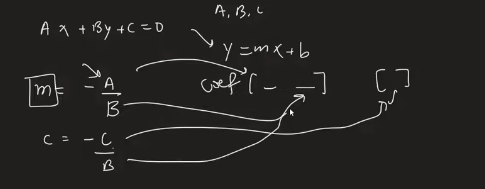

In [22]:
m = -(coef_[0]/coef_[1])
b = -(intercept_/coef_[1])

In [23]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

(-3.0, 2.0)

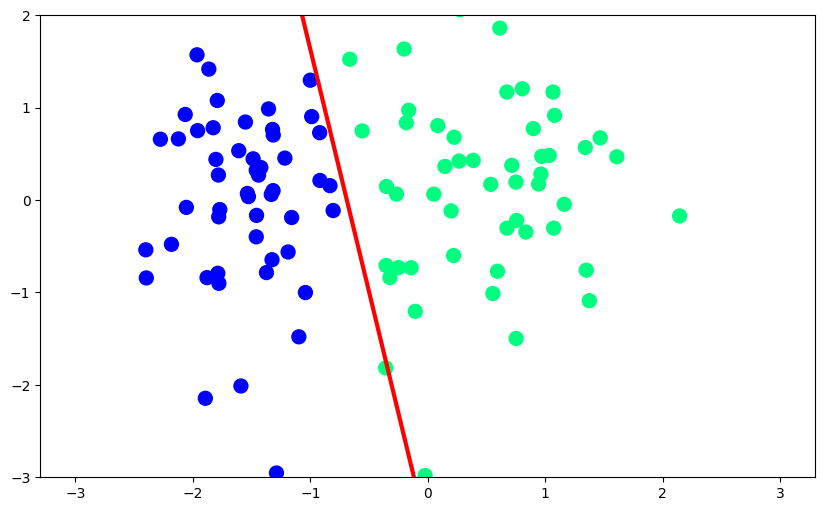

In [24]:
plt.figure(figsize=(10,6))
plt.plot(x_input, y_input, color='red', linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y, cmap='winter',s=100)
plt.ylim(-3,2)

In [25]:
def perceptron(X,y):
    
    m = []
    b = []
    
    X = np.insert(X,0,1,axis=1)
    weights = np.ones(X.shape[1])
    lr = 0.1
    
    for i in range(200):
        j = np.random.randint(0,100)
        y_hat = step(np.dot(X[j],weights))
        weights = weights + lr*(y[j]-y_hat)*X[j]
        
        m.append(-(weights[1]/weights[2]))
        b.append(-(weights[0]/weights[2]))
        
    return m,b


In [26]:
m,b = perceptron(X,y)

In [30]:
%matplotlib notebook
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [31]:
fig, ax = plt.subplots(figsize=(9,5))

x_i = np.arange(-3, 3, 0.1)
y_i = x_i*m[0] +b[0]
ax.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
line, = ax.plot(x_i, x_i*m[0] +b[0] , 'r-', linewidth=2)
plt.ylim(-3,3)
def update(i):
    label = 'epoch {0}'.format(i + 1)
    line.set_ydata(x_i*m[i] + b[i])
    ax.set_xlabel(label)
    # return line, ax

anim = FuncAnimation(fig, update, repeat=True, frames=200, interval=100)

HTML(anim.to_jshtml())

<IPython.core.display.Javascript object>

### doing it with sklearns logistic regression

In [32]:
from sklearn.linear_model import LogisticRegression
lor = LogisticRegression()
lor.fit(X,y)

LogisticRegression()

In [33]:
m = -(lor.coef_[0][0]/lor.coef_[0][1])
b = -(lor.intercept_/lor.coef_[0][1])

In [34]:
x_input1 = np.linspace(-3,3,100)
y_input1 = m*x_input + b

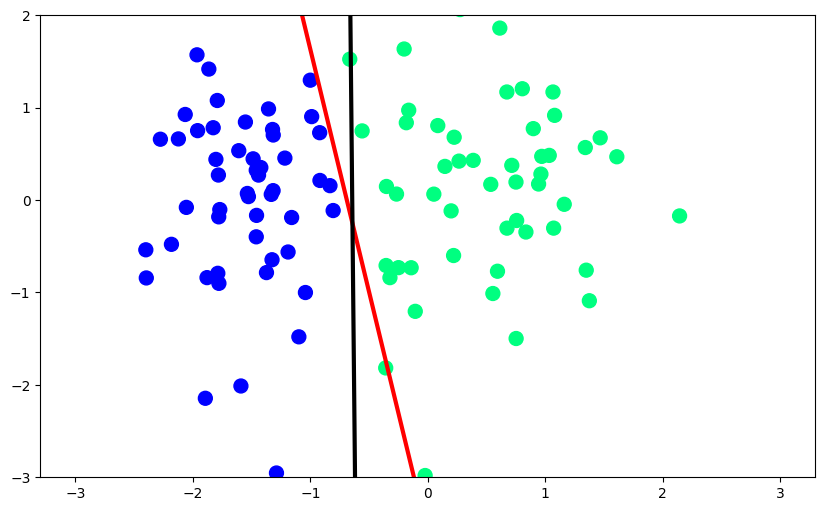

In [ ]:
%matplotlib inline 
# this above line %matplotlib inline is very important to display the graph in older jupyter notebook other wise not showing
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.plot(x_input1,y_input1,color='black',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

plt.show()


## whats missing in perceptoron trick
* if we change the class_sep in make_classification then the distance between the class increase 
* the perceptron trick stops as soon as it classifiyes all the points but logistic regression simitricaly cuts the points..

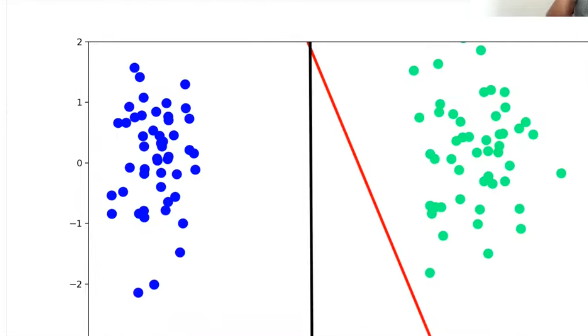

* perceptron doesnt give the best line whereas the logistic tries to find the best line